# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Неизвестно, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цель исследования**:
- Найти интересные особенности мест и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания в Москве. 

**Таким образом, исследование пройдёт в несколько этапов:**
 1. Обзор данных
 2. Предобработка данных
 3. Исследовательский анализ данных
 4. Детализация исследования: открытие кофейни
 5. Подготовка презентации
 6. Формулирование вывода

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import scipy.stats as stats
import datetime as dt
import plotly.express as px
from plotly import graph_objects as go
import matplotlib.pyplot as plt
import folium
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

In [2]:
import plotly.io as pio
pio.renderers.default = "png"

## Загрузка и подготовка данных к анализу

### Обзор данных

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data['name'].nunique()

5614

Представлено 8406 заведений, из которых 5614 уникальных (из-за сетевых заведений).
В таблице 14 столбцов, в 6 из них есть пропуски.

Столбцы с данными: 
- название заведения, его тип, адрес, район, в котором оно находится, часы работы, уровень цен и средняя стоимость заказа представлены в формате object
- координаты заведения, рейтинг, средний чек, стоимость чашки кофе и количество посадочных мест - в формате float64
- столбец chain хранит целое число (1 - если заведение сетевое, 0 - если несетевое).

### Предобработка данных

In [7]:
data.duplicated().sum()

0

Явных дубликатов в данных нет

In [8]:
data[['name','address']].duplicated().sum()

0

Неявные дебликаты тоже отсутсвуют

In [9]:
pd.DataFrame(round(data.isna().mean()*100)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Пропущенные значения в столбцах:
- `hours` (информация о днях и часах работы)
- `price` (категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее)
- `avg_bill` (строка, которая хранит среднюю стоимость заказа в виде диапазона)
- `middle_avg_bill` (число с оценкой среднего чека, которое указано только для значений из столбца avg_bill)
- `middle_coffee_cup` ( число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill)
- `seats` (количество посадочных мест)

В столбце с часами работы 6% пропусков, в столбце с к-вом посадочных мест - почти 43%. Заполнить эти пропуски мы не можем. Лучше у нас будут неполные данные, зато точные.

В столбце `price` 60% пропусков, в `avg_bill` - почти 55%. Для анализа эти столбцы не пригодятся, поэтому оставим пропуски.

При анализе цен заведений мы будем использовать столбцы со средним чеком (62% пропусков) и ценой чашки капучино (93% пропусков). Доля пропусков здесь очень большая, но заполнить их достоверно не получится, поэтому оставим их.

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [10]:
def street (x):  
      return  x.split(',')[1].strip()            

In [11]:
data['street'] = data['address'].apply(street)

```python
data['address'].str.split(', ').str[1]
```

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [12]:
def is_24_7 (x):  
      return x == 'ежедневно, круглосуточно'

In [13]:
data['is_24_7'] = data['hours'].apply(is_24_7)

У нас есть датасет с 8406 строками(заведениями)

Мы проверили данные на наличие явных и неявных дубликатов. Их не оказалось. 

В данных есть пропуски, но достоверно заполнить их не получится, поэтому будем работать с тем, что есть.

```python
data['hours'].str.contains('ежедневно, круглосуточно')

```

## Анализ данных

### Категории заведений

In [14]:
categories = data.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False)
categories

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


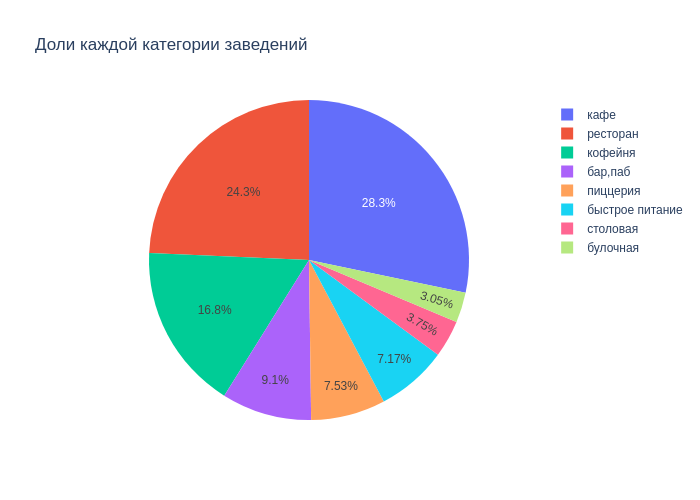

In [15]:
fig = go.Figure(data=[go.Pie(labels=categories['category'], values=categories['name'])])
fig.update_layout(title='Доли каждой категории заведений')
fig.show() 

В данных представлены заведения категорий: кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая. На круговой диаграме наглядно видно, что три самых популярных типа заведений - это кафе (28,3% от всех заведений), ресторан (24,3% от всех заведений) и кофейня (16,8% от всех заведений).

Меньше всего булочных (3%) и столовых (3,75%).

### Количество посадочных мест

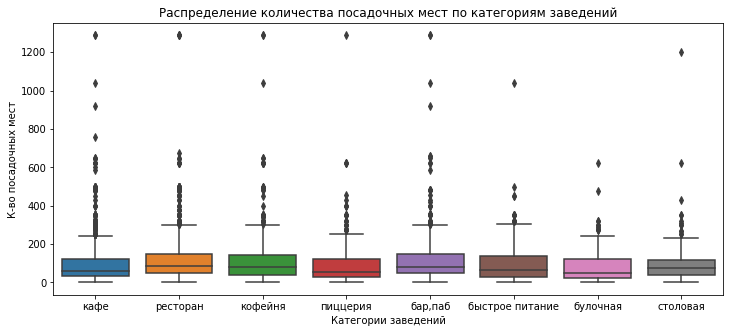

In [16]:
plt.figure(figsize=(12, 5))
ax = sns.boxplot(x='category', y='seats', data=data) 
ax.set(xlabel='Категории заведений', ylabel='К-во посадочных мест')
plt.title("Распределение количества посадочных мест по категориям заведений")
plt.show()

По графику видно, что в каждой категории есть очевидные выбросы, которые исказят среднее значение, поэтому будем искать медиану.

In [17]:
seats=data.groupby('category', as_index=False).agg({'seats':'median'}).sort_values(by='seats', ascending=False)
seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


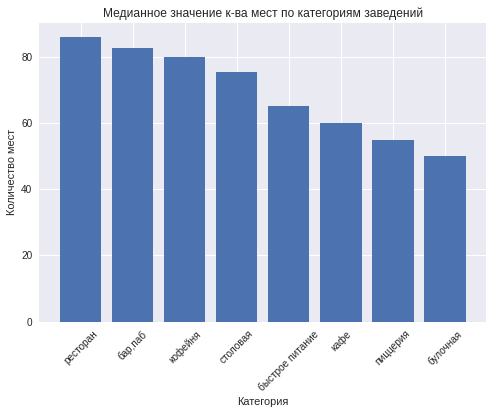

In [18]:
with plt.style.context('seaborn'):
    plt.bar(seats['category'],seats['seats'])
    plt.xlabel("Категория")
    plt.ylabel("Количество мест")
    plt.title('Медианное значение к-ва мест по категориям заведений')
    plt.xticks(rotation=45)
    plt.show()

По построенным графикам можно сделать вывод, что больше всего посадочных мест - в ресторанах, затем в барах/пабах и в кофейнях. Меньше всего - в булочных.

### Соотношение сетевых и несетевых заведений

In [19]:
def typee(x):
    if x == 1:
        return 'сетевое'
    else:
        return 'несетевое'

In [20]:
data['type'] = data['chain'].apply(typee)

In [21]:
chain=data.groupby('type', as_index=False)['name'].count()
chain

,type,name
0,несетевое,5201
1,сетевое,3205


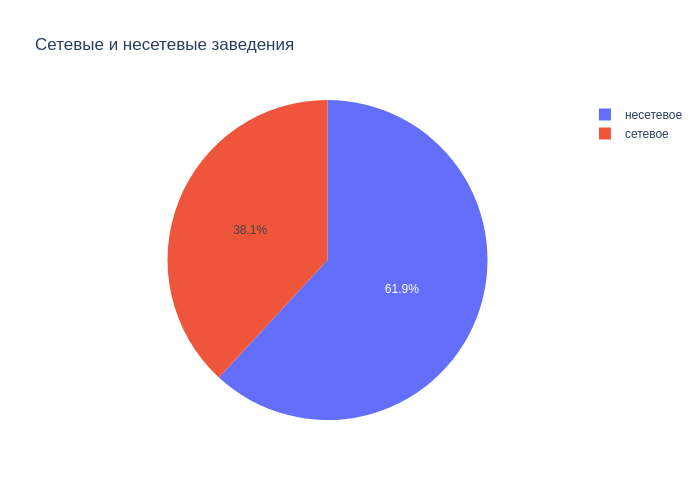

In [22]:
fig = go.Figure(data=[go.Pie(labels=chain['type'], values=chain['name'])])
fig.update_layout(title='Сетевые и несетевые заведения')
fig.show() 

Как показывает график, несетевых заведений в Москве гораздо больше, чем сетевых.

Соотношение сетевых заведений к несетевым: 38,1% к 61,9%.

### Какие категории заведений чаще являются сетевыми

In [23]:
chain_yes=data[data['chain']==1]

In [24]:
chain_category=chain_yes.groupby('category', as_index=False)['chain'].count()
chain_category

,category,chain
0,"бар,паб",169
1,булочная,157
2,быстрое питание,232
3,кафе,779
4,кофейня,720
5,пиццерия,330
6,ресторан,730
7,столовая,88


Чаще являются сетевыми кафе, рестораны и кофейни. Реже всего сетевые столовые и булочные. Но это из-за того, что кафе и ресторанов впринципе больше. Посмотрим соотношение сетевых к несетевым по каждой категории

In [25]:
chain_no=data[data['chain']==0]
no_chain_category=chain_no.groupby('category', as_index=False)['chain'].count()
chain_category['no_chain']=no_chain_category['chain']
chain_category['share_of_chain']= chain_category['chain']/chain_category['no_chain']
chain_category=chain_category.sort_values(by='share_of_chain')

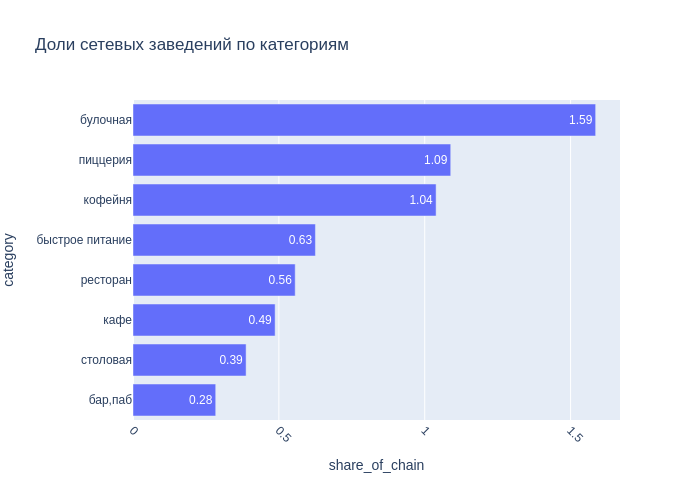

In [26]:
fig = px.bar(chain_category, x=chain_category['share_of_chain'], y=chain_category['category'], title='Доли сетевых заведений по категориям', text=round(chain_category['share_of_chain'], 2))
fig.update_xaxes(tickangle=45)
fig.show() 

Сетевых заведений больше булочных(в отношении 1.58), пиццерий(1.08) и кофеен(1.03). Бары, столовые и кафе чаще всего несетевые.

###  Топ-15 популярных сетей

In [27]:
chain_yes['name2']=chain_yes['name']
top_chains = chain_yes.groupby('name', as_index=False)['name2'].count().sort_values(by='name2', ascending=False)
top_chains.head(15)

,name,name2
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


Яндекс Лавка это не заведение, а служба доставки продуктов - уберем из списка.

In [28]:
false = ['Яндекс Лавка']

top_chains = top_chains.query('name not in @false')
top_chains= top_chains.head(15)
top_chains

,name,name2
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39
643,Теремок,38


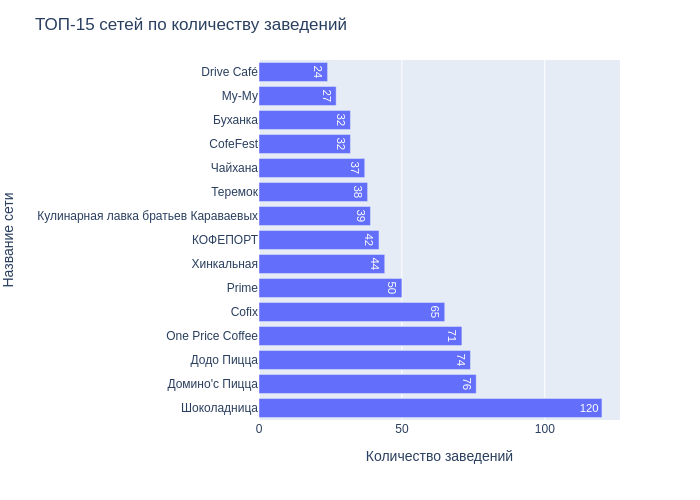

In [29]:
fig = px.bar(top_chains, 
             x='name2', 
             y='name', 
             text='name2' 
            )                  
fig.update_layout(title='ТОП-15 сетей по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show() 

"Шоколадница" - самая крупная сеть. Далее идут две пиццерии и две кофейни с фиксироваными ценами. Во всех них доступные цены.

In [30]:
top_chains_list=top_chains['name'].tolist()
top_chains_data=data.query('name in @top_chains_list')

In [31]:
top_price = top_chains_data[['name','price']].drop_duplicates().dropna()
top_price.value_counts('price')

price
средние          13
низкие            9
выше среднего     3
высокие           1
dtype: int64

В основном в топовых сетях средние и низкие цены

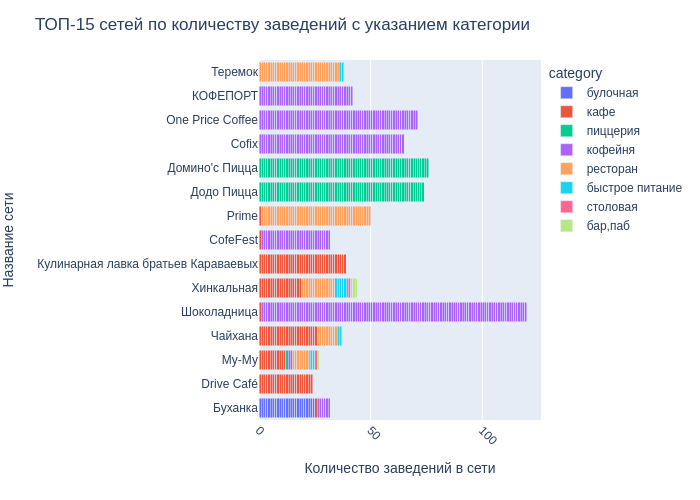

In [32]:
fig = px.bar(top_chains_data, x='chain', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='ТОП-15 сетей по количеству заведений с указанием категории',
                   xaxis_title='Количество заведений в сети',
                   yaxis_title='Название сети')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Не всегда в датасете все сетевые заведения относятся к одной категории. Например, два заведения Теремка отнесли к категории быстрое питание. Это некритично, так как в заведении могут быть разные услуги. 

Категории в топе: кофейни, кафе, рестораны, пиццерии.

### Распределение по районам

In [33]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Всего у нас есть 9 районов. Узнаем количество заведений и количество заведений каждой категории по районам

In [34]:
top_by_district = data.groupby(['district','category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)


In [35]:
top_by_district

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


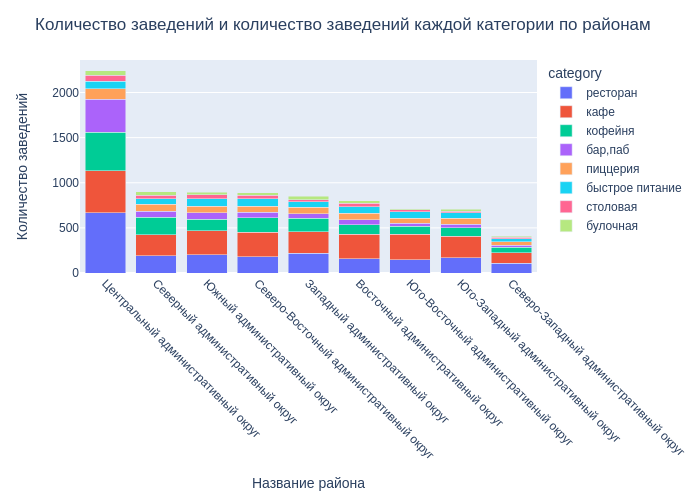

In [36]:
fig = px.bar(top_by_district, x='district', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество заведений и количество заведений каждой категории по районам',
                   xaxis_title='Название района',
                   yaxis_title='Количество заведений')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Как показывает график, в ЦАО более чем в 2 раза больше заведений, чем в любом другом округе. Меньше всего заведений - в СЗАО.

В ЦАО самые крупные категории - ресторан, кафе, кофейня. В остальных округах также больше всего кафе, ресторанов и кофеен. 

### Распределение средних рейтингов по категориям

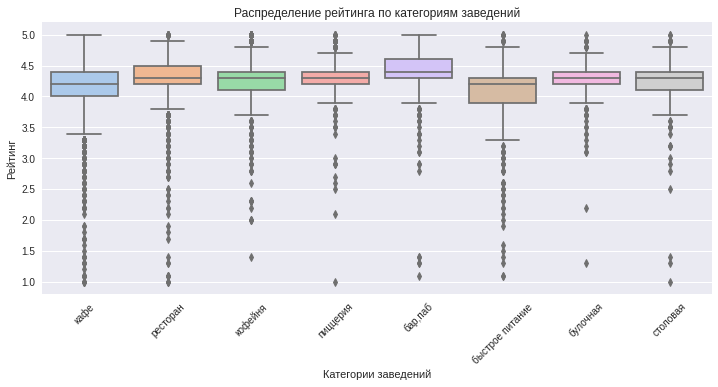

In [37]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(12, 5))
    ax = sns.boxplot(x='category', y='rating', data=data, palette='pastel') 
    ax.set(xlabel='Категории заведений', ylabel='Рейтинг')
    plt.title("Распределение рейтинга по категориям заведений")
    plt.xticks(rotation=45)
    plt.show()

Видно, что все категории в среднем имеют хороший рейтинг. 

Самый высокий средний рейтинг у баров, самый низкий - у фастфуда, но разница между ними несущественная.

### Средний рейтинг по районам

In [38]:
rating_by_district = (data
                      .groupby('district', as_index=False)
                      .agg({'rating':'mean'})
                      .sort_values(by='rating', ascending=False)
                     )
rating_by_district

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [39]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг - у заведений в ЦАО, самый низкий - в ЮВАО, но разница между ними небольшая - 0,27 балла.

### Все заведения датасета на карте

In [40]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

###  Топ-15 улиц по количеству заведений

In [41]:
data['street'].value_counts().head(15)

проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: street, dtype: int64

In [42]:
top15_streets = (data
                 .groupby('street', as_index=False)
                 .agg({'name':'count'})
                 .sort_values(by='name', ascending=False)
                 .head(15)
                 .reset_index()
                )
top15_streets_list = top15_streets['street'].tolist()
by_street = (data
             .query('street in @top15_streets_list')
             .groupby(['street','category'], as_index=False)
             .agg({'name':'count'})
            )

In [43]:
(data
 .query('street in @top15_streets_list')
 .groupby('district')
 .agg({'street':'nunique'})
 .sort_values(by='street', ascending=False)
)

,street
district,
Юго-Западный административный округ,6
Южный административный округ,5
Западный административный округ,4
Северный административный округ,4
Северо-Восточный административный округ,3
Центральный административный округ,3
Юго-Восточный административный округ,2
Восточный административный округ,1
Северо-Западный административный округ,1


Улиц из топа больше всего в ЮЗАО, хотя казалось, большинство из них в ЦАО. В ЦАО таких улиц всего 3.

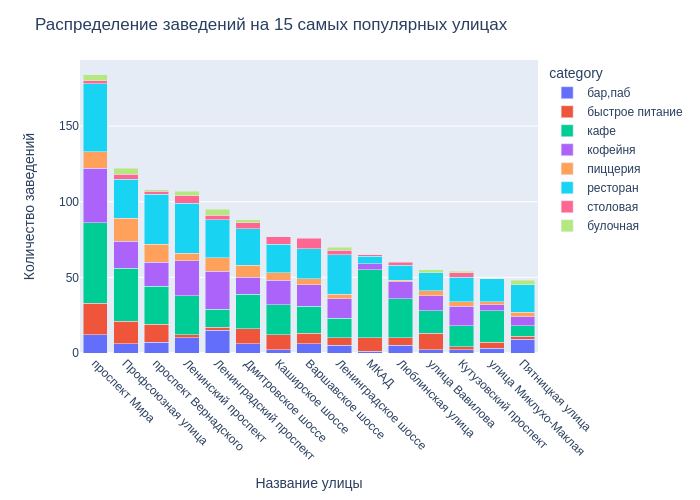

In [44]:
fig = px.bar(by_street, x='street', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение заведений на 15 самых популярных улицах',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Больше всего заведений на проспекте Мира.

Самые популярные категории заведений на большинстве улиц - кафе, ресторан и кофейня, однако в остальном распределение неравномерно. Например, на проспекте Мира большая доля фастфуда, которого почти нет на Ленинском и Ленинградском проспекте. На Ленинградском проспекте много баров, а на МКАДе их почти нет.

Эти улицы людные, на них находится много популярных объектов. Например на Проспекте мира находится ВДНХ, вокзал. Эти улицы самые конкурентные.

### Улицы, на которых находится только один объект общепита

In [45]:
street_grouped = data.groupby('street', as_index=False).agg({'name':'count'})
street_grouped_1 = street_grouped[street_grouped['name']==1]
street_grouped_1_list = street_grouped_1['street'].tolist()
streets_with1 = data.query('street in @street_grouped_1_list')

In [46]:
streets_with1['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Улиц с 1 заведением больше всего в ЦАО.

In [47]:
streets_with1['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Больше всего улиц с одним заведением в ЦАО (145), меньше всего в ЮЗАО (18).

Больше всего кафе, меньше всего булочных.



### Средний чек по районам

In [48]:
bill_by_district = (data
                    .groupby('district', as_index=False)
                    .agg({'middle_avg_bill':'median'})
                    .sort_values(by='middle_avg_bill', ascending=False)
                   )

bill_by_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [49]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m1)

m1

Самые дорогие районы ЦАО и ЗАО (1000 руб. средний чек), что неудивительно. Самый дешевый район - ЮВАО (450 руб средний чек).

### Вывод 

Мы изучили датасет с 8406 заведеними общепита Москвы и сделали некоторые выводы.

Три самых популярных типа заведений - это кафе (28,3% от всех заведений), ресторан (24,3% от всех заведений) и кофейня (16,8% от всех заведений). Меньше всего булочных (3%) и столовых (3,75%).

Больше всего посадочных мест - в ресторанах, затем в барах/пабах и в кофейнях. Меньше всего - в булочных.

Соотношение сетевых заведений к несетевым - 38% к 62%. Доля сетевых заведений выше всего среди булочных, пиццерий и кофеен.

Большинство сетей из топ-15 принадлежит к средней и низкой ценовой категории.

В ЦАО более чем в 2 раза больше заведений, чем в любом другом округе. Меньше всего заведений - в СЗАО. Почти во всех округах самые крупные категории заведений - кофейня, кафе и ресторан.

Средний рейтинг заведения практически не различается ни по категориям (самый высокий средний рейтинг у баров, самый низкий - у фастфуда, но разница между ними 0,33 балла), ни по округам (самый высокий средний рейтинг - у заведений в ЦАО, самый низкий - в ЮВАО, но разница между ними небольшая - 0,27 балла).

Мы нашли топ-15 улиц, на которых больше всего заведений. Лидер по количеству заведений - проспект Мира. Больше всего таких улиц находятся в ЮЗАО, в ЦАО только 3 таких улицы. Самыми популярными категориями заведений на этих улицах остаются кафе, ресторан и кофейня.

Больше всего улиц с одним заведением в ЦАО (145), меньше всего в ЮЗАО (18). Большинство заведений - со средним уровнем цен. Больше всего кафе, меньше всего булочных. Несетевых заведений в 2 с лишним раза больше, чем сетевых.

Дороже всего поход в заведение обойдется в ЦАО и ЗАО (1000 рублей средний чек). Самый низкий средний чек - в ЮВАО (450 рублей).

## Исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Необходимо определить, осуществима ли мечта клиентов.

### Расположение кофеен

In [50]:
coffee=data[data['category']=='кофейня']
len(coffee)

1413

Всего 1413 кофеен в датасете.

In [51]:
coffee_by_district=coffee['district'].value_counts().reset_index()
coffee_by_district

,index,district
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


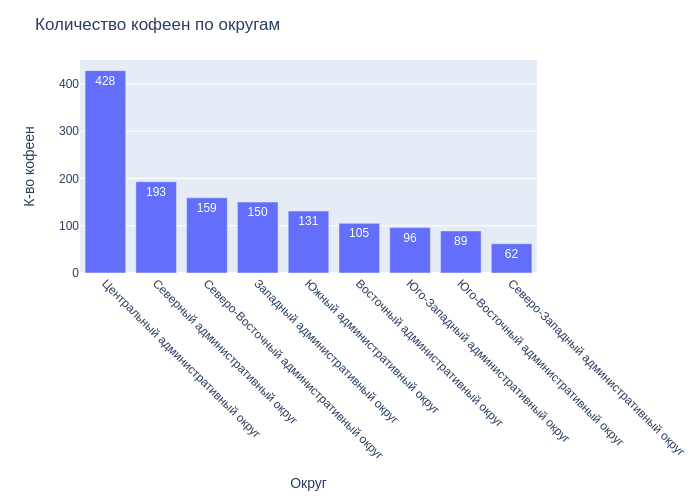

In [52]:
fig = px.bar(coffee_by_district, x='index', y='district', text='district')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество кофеен по округам',
                   xaxis_title='Округ',
                   yaxis_title='К-во кофеен')
fig.show()

Кофеен больше всего находится в ЦАО, далее идет САО, но там кофеен уже в 2 раза меньше. Меньше всего кофеен в СЗАО.

In [53]:
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(coffee_map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

coffee_map

Чаще всего кофейни расположены на больших улицах, где ходит больше людей.

### Круглосуточные кофейни

In [54]:
coffee.groupby('is_24_7').agg({'name':'count'})

,name
is_24_7,
False,1354
True,59


In [55]:
coffe_24_7=coffee[coffee['is_24_7']==True]

В датасете 59 круглосуточных кофеен

In [56]:
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(coffee_map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffe_24_7.apply(create_clusters, axis=1)

coffee_map

Круглосуточные кофейни расположены чаще всего в центре и рядом с вокзалами. В местах, где всегда ходят люди.

### Рейтинг кофеен

In [57]:
coffee_rating = coffee.groupby('district', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)

coffee_rating

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


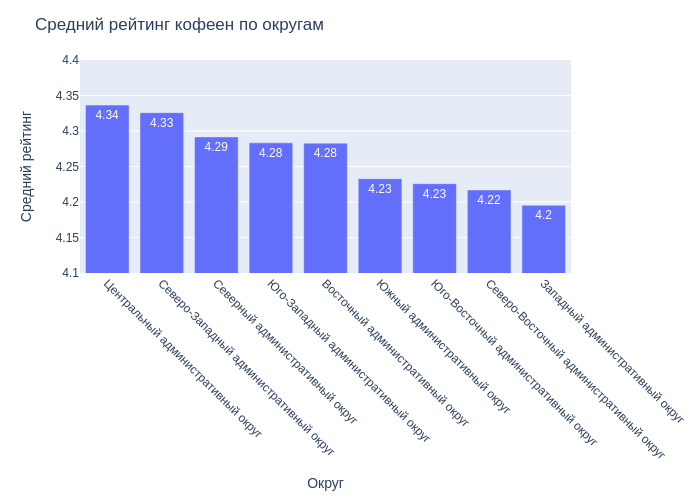

In [58]:
fig = px.bar(coffee_rating, x='district', y='rating', text=round(coffee_rating['rating'], 2))
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Средний рейтинг кофеен по округам',
                   xaxis_title='Округ',
                   yaxis_title='Средний рейтинг',
                 yaxis_range=[4.1,4.4]
                 )
fig.show()

Как видно на графике, средний рейтинг кофеен между округами практически не отличается.

Самый высокий средний рейтинг у кофеен ЦАО, самый низкий - ЗАО, но между ними всего 0,14 балла разницы.

### Стоимость чашки кофе

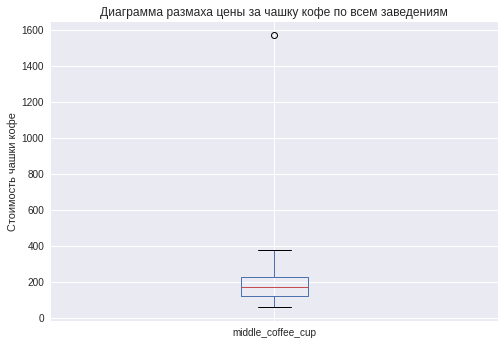

In [59]:
with plt.style.context('seaborn'):
    coffee['middle_coffee_cup'].plot.box()
    plt.ylabel("Стоимость чашки кофе")
    plt.title('Диаграмма размаха цены за чашку кофе по всем заведениям')
    plt.show()

Удалим выброс

In [60]:
coffee=coffee[coffee['middle_coffee_cup']<1000]

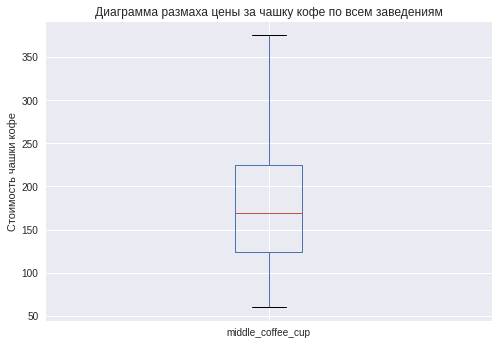

In [61]:
with plt.style.context('seaborn'):
    coffee['middle_coffee_cup'].plot.box()
    plt.ylabel("Стоимость чашки кофе")
    plt.title('Диаграмма размаха цены за чашку кофе по всем заведениям')
    plt.show()

In [62]:
coffee['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

В среднем чашка кофе по Москве стоит 169 руб.

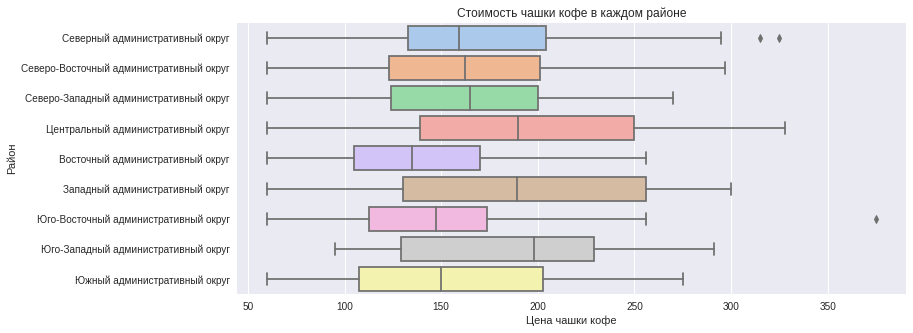

In [63]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(12, 5))
    ax = sns.boxplot(x='middle_coffee_cup', y='district', data=coffee, palette='pastel') 
    ax.set(xlabel='Цена чашки кофе', ylabel='Район')
    plt.title('Стоимость чашки кофе в каждом районе')
    plt.xticks(rotation=0)
    plt.show()

В среднем цена чашки кофе колеблется в районе 150–200 рублей во всех округах. В ЦАО большой размах цен. Надо смотреть медиану.

In [64]:
# посчитаем медианную цену чашки кофе по округам

median_price = coffee.groupby('district', as_index=False).agg({'middle_coffee_cup':'median'}).sort_values(by='middle_coffee_cup', ascending=False)
median_price

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


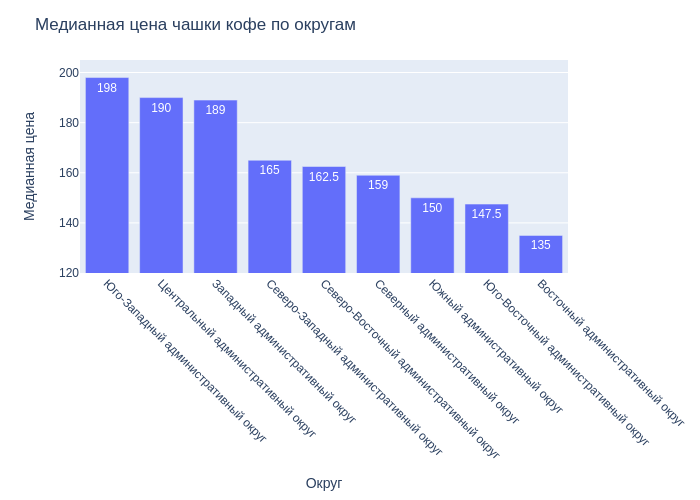

In [65]:
fig = px.bar(median_price, x='district', y='middle_coffee_cup', text='middle_coffee_cup')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Медианная цена чашки кофе по округам',
                   xaxis_title='Округ',
                   yaxis_title='Медианная цена',
                  yaxis_range=[120,205]
                 )
fig.show()

Как мы видим, дороже всего кофе стоит в ЮЗАО: медианная цена 198 рублей. В ЦАО и ЗАО цена почти одинакова - 190 рублей.

Самая низкая медианная цена капучино в ВАО - 135 рублей.

Рекомендация по цене за чашку капучино в выводе далее

## Вывод и рекомендации

Всего в датасете 1413 кофеен. 

По числу кофеен с большим отрывом лидирует ЦАО (428), на втором месте САО (193). Меньше всего кофеен в СЗАО (62).

Во всех районах в среднем высокий рейтинг. Однако в некоторых округах, например, СЗАО и ЮЗАО, разброс оценок небольшой - оценки начинаются примерно от 3,5 и выше. А в других округах разброс больше, например, в САО и СВАО.

Средний рейтинг кофеен между округами практически не отличается. Самый высокий средний рейтинг у кофеен ЦАО, самый низкий - ЗАО, но между ними всего 0,14 балла разницы.

В среднем цена чашки капучино колеблется в районе 150–200 рублей во всех округах.

Дороже всего кофе стоит в ЮЗАО: медианная цена 198 рублей. В ЦАО и ЗАО цена почти одинакова - 190 рублей. Самая низкая медианная цена капучино в ВАО - 135 рублей.


## Рекомендации по открытию кофейни

Стоит отметить, что порекомендовать место для открытия кофейни на основании данных, которые у нас имеются, сложно. Для начала хорошо было бы проанализировать объявления об аренде и данные о проходимости разных мест, чтобы рекомендовать что-то конкретное. Сейчас же мы можем дать лишь общие рекомендации.

По сериалу кофейня «Central Perk» это несетевая, доступная, рассчитанная скорее на «местных», постоянных клиентов кофейня.

Такую кофейню не стоит открывать рядом с торговым центром, вокзалом, университетом или бизнес-центром, потому что в людных местах может быть излишняя столпотворенность, что делает место неуютным и мало кто из посетителей будет сидеть долго.

Также не стоит открываться вблизи самых популярных достопримечательностей, например, рядом с Красной площадью, если заказчики не хотят, чтобы большинство клиентов были туристы, которые зайдут в кафе один раз.

При этом «Central Perk» находился в центре Манхеттена, а не в тихом районе. Поэтому мы рекомендуем открыть кофейню в Центральном административном округе, например, в Хамовниках или Замоскворечье. В частности, в Хамовниках довольно мало кофеен по сравнению с другими районами ЦАО (как можно увидеть на карте выше).

Как мы видим на графике выше, кофе в ЦАО - среди самых дорогих по городу. В среднем капучино стоит 200 рублей, но есть и цены в 300 и даже больше рублей. Считаем, что при открытии кофейни можно ориентироватья на 200-250 рублей за чашку капучино.